# Segmentace obrazu a měření rozměrů
Základní znalostí při zpracování obrazu je nejenom ideálně nasnímat obraz, ale hlavně ze získaného obrazu dostat použitelné informace. Extrakce objektů z obrazu (oddělení objektů od pozadí) se nazývá segmentace. Nejčastěji se využívá metod prahování, hranové detekce nebo kontur ([viz link](https://circuitdigest.com/tutorial/image-segmentation-using-opencv)).

Když už se podaří získat z obrazu objekty, je dále potřeba změřit jejich rozměry - a to nejen v pixelech, ale hlavně reálné rozměry v cm nebo dokonce v menších jednotkách. 

Na cvičení se bude využívat umělý obrázek s objekty, jejichž rozměry bude třeba automatizovaně získat.

![](images/index.jpg)

### Import knihoven a konfigurace

In [3]:
%run ./library.ipynb

### Pomocné funkce
Z následujících funkcí je potřeba vybírat ty vhodné pro splnění úkolu.

Seznam funkcí pro přehlednost:


Úkol 1
- [`load_image(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/acquisition/img_io.py#L11)
- [`plot_images(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/visualisation/visualisation.py#L11)
- [`crop(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/preprocessing/preprocessing.py#L94)
- [`to_gray(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/preprocessing/preprocessing.py#L4)
- [`segmentation_one_threshold(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/segmentation/segmentation.py#L50)
- [`segmentation_two_thresholds(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/segmentation/segmentation.py#L82)
- [`to_hsv(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/preprocessing/preprocessing.py#L20)
- [`to_intensity(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/segmentation/segmentation.py#L13)
- [`find_contours(...)`](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/-/blob/master/improutils/preprocessing/contours.py#L40)
- [`cv2.minAreaRect(...)`](https://docs.opencv.org/3.1.0/d3/dc0/group__imgproc__shape.html#ga3d476a3417130ae5154aea421ca7ead9)
- [`cv2.boxPoints(...)`](https://docs.opencv.org/3.1.0/d3/dc0/group__imgproc__shape.html#gaf78d467e024b4d7936cf9397185d2f5c)

Úkol 2
- [`draw_rotated_text(...)`](./library.ipynb)
- [`draw_real_sizes(...)`](./library.ipynb)

---

### Úkol 1

Úkol je zaměřen na segmentace obrazů, získání kontur objektů a měření poměru rozměrů v cm a pixelech.

**1) Nasnímejte papír se vzory a uložte jej do složky data. Obrázek poté načtěte a zobrazte. Nakonec nadefinujte proměné s šířkou a výškou referečního objektu.**

Obrázek nastavte tak, aby byl ideálně záběr pouze na papír. *HINT: Je možné pomoci si oříznutím obrázku (crop).*

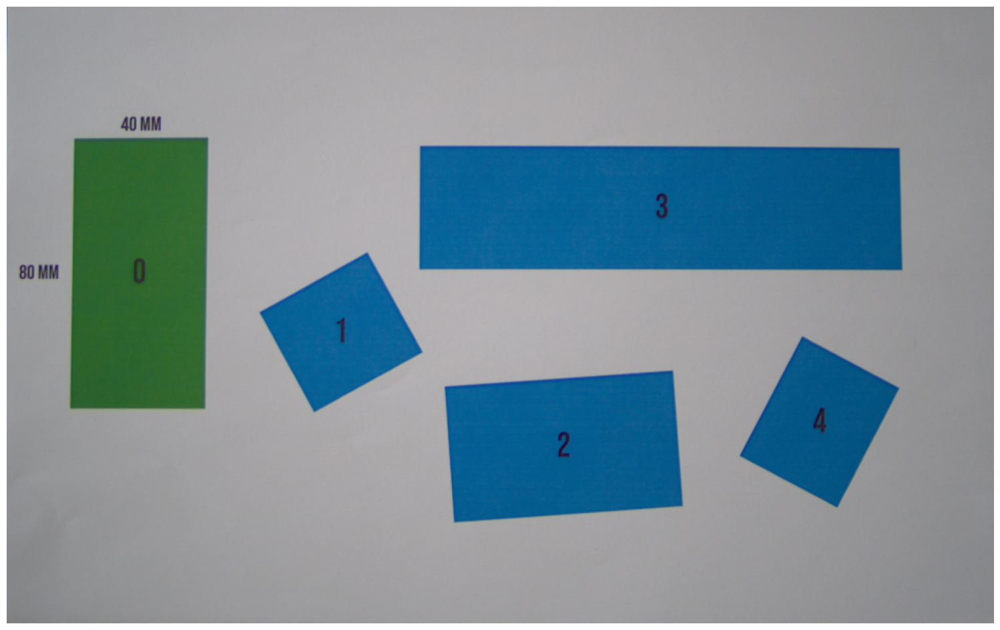

In [5]:
img_patterns = load_image("ctver.bmp")
# snížení velikosti obrázku pro rychlejší výpočet v interact slideru
img_patterns = cv2.resize(img_patterns, 
                          dsize = None, fx=0.5, fy=0.5, interpolation = cv2.INTER_AREA)
plot_images(img_patterns) ###

In [6]:
ref_width_real = 40
ref_height_real = 80

**2) Převeďte obrázek do šedotónu a segmentací získejte masku referenčního obdélníku.**


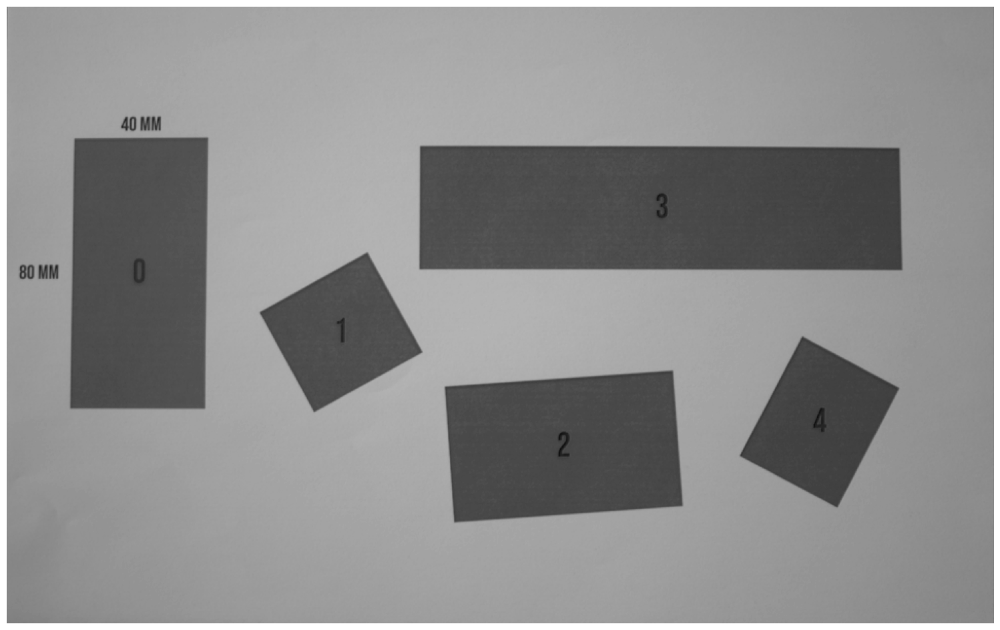

In [7]:
img_patterns_gray = to_gray(img_patterns)
plot_images(img_patterns_gray) ###

Vyberte vhodnou funkci a experimentujte se sliderem (políčko s číselnými hodnotami je editovatelné).

interactive(children=(IntRangeSlider(value=(0, 255), continuous_update=False, description='Threshold range:\xa…

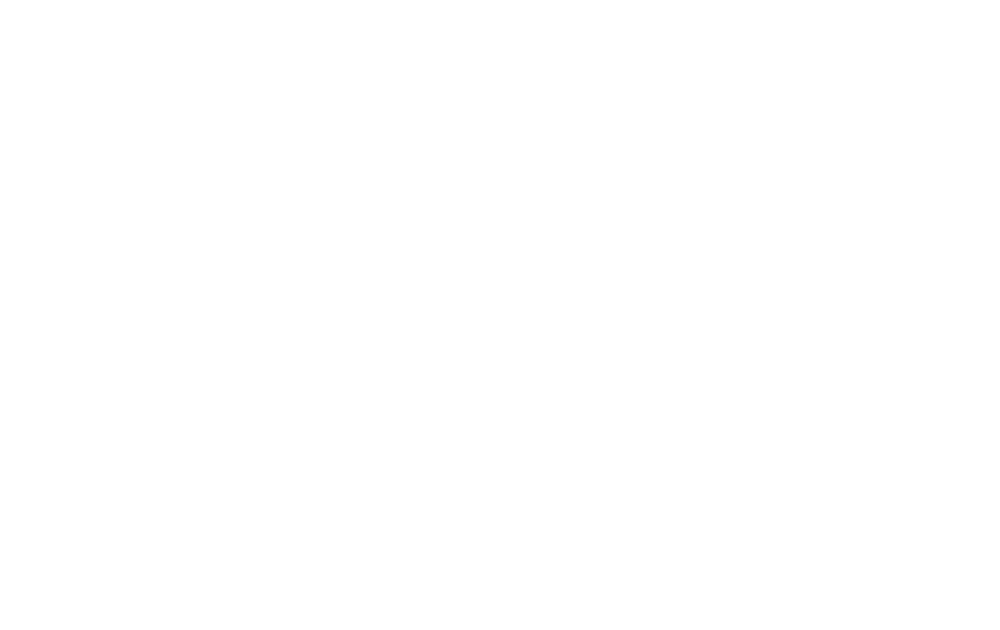

In [8]:
@interact(threshold_range=create_slider(min=0, max=255, description='Threshold range:',))
def _(threshold_range):
    mask = segmentation_two_thresholds(img_patterns_gray, threshold_range[0], threshold_range[1]) ###
    plot_images(mask)

Optimální hodnoty zaneste do funkce:

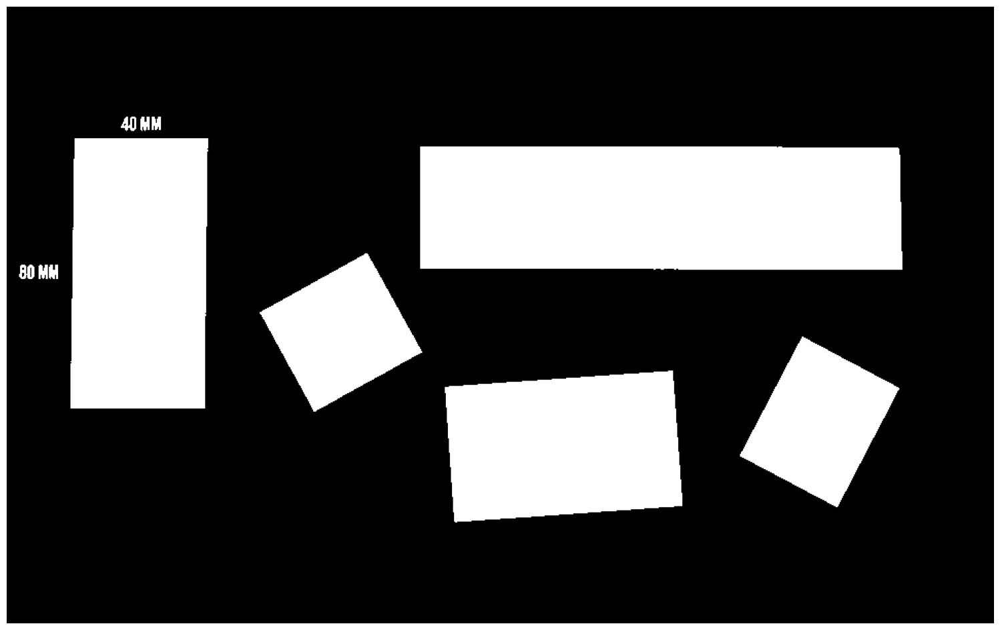

In [9]:
mask = segmentation_two_thresholds(img_patterns_gray, 0, 112) ###
plot_images(mask)

**3) BONUS: šedotónový obrázek je jen 2D numpy array, proveďte stejnou segmentaci pomocí numpy operací. (1b)**

Poznámka 1: for cyklus **není** numpy operace.

Poznámka 2: bonusové body je možné získat až po vypracování obou notebooků.

In [ ]:
def segment_gray_np(img, l_bound, u_bound):
    mask = ... ###
    return mask

In [ ]:
mask = segment_gray_np(img_patterns_gray, ..., ...)
 ###
plot_images(mask)

**4) Převeďte obrázek do do vhodné barevné soustavy, získejte masku referenčního obdélníku.**

![](https://i.stack.imgur.com/YOBFy.png)

In [10]:
img_patterns_color = to_hsv(img_patterns) ###

interactive(children=(IntRangeSlider(value=(0, 360), continuous_update=False, description='Hue:\xa0\xa0\xa0\xa…

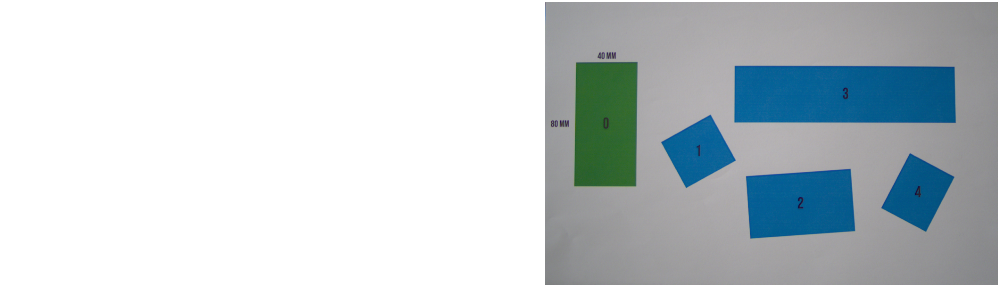

In [11]:
@interact(h_range=create_slider(min=0, max=360, description='Hue:'),
          s_range=create_slider(min=0, max=255, description='Saturation:'),
          v_range=create_slider(min=0, max=255, description='Value:'))
def _(h_range, s_range, v_range):

    lower_bound = (to_intensity(h_range[0]), s_range[0], v_range[0])
    upper_bound = (to_intensity(h_range[1]), s_range[1], v_range[1])
    
    mask = segmentation_two_thresholds(img_patterns_color,lower_bound,upper_bound) ###
    plot_images(mask, apply_mask(img_patterns, mask))

Optimální hodnoty zaneste do funkcí:

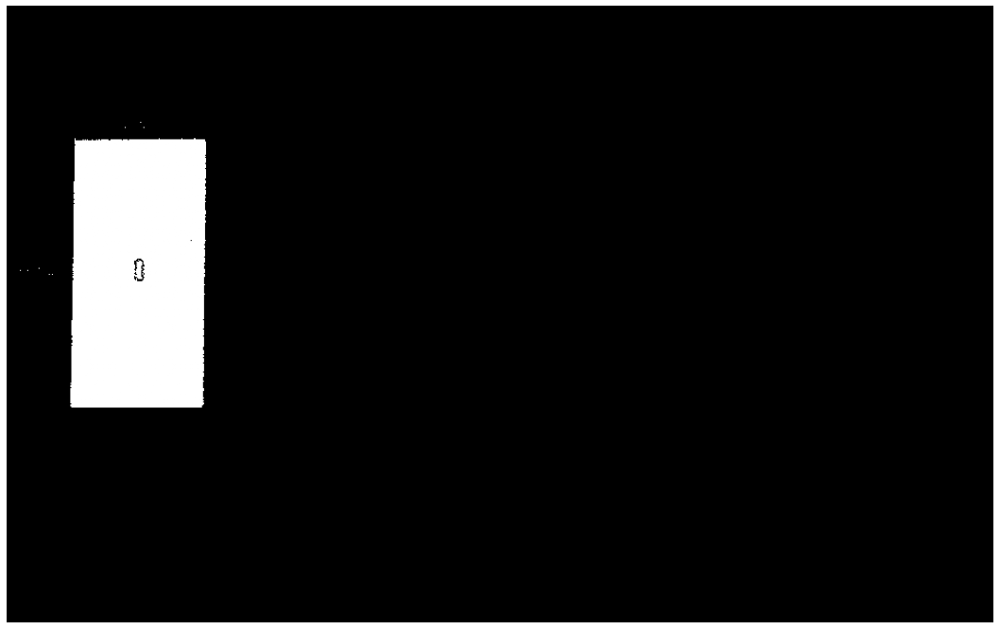

In [20]:
lower_bound = (to_intensity(90), 0, 0) ###
upper_bound = (to_intensity(150), 255, 110) ###

mask = segmentation_two_thresholds(img_patterns_color, lower_bound, upper_bound) ###
plot_images(mask)

**5) Naleznete konturu která pokrývá nevětší plochu, otestujte aproximace kontury na obdélník.**

Výsledná maska by měla ideálně obsahovat pouze referenční obdelník, v obrazu se ale obecně může vyskytovat i šum. 
Nyní je nutné získat pozici referenčního obdelníku v obraze masky. 
Nejjednoduším způsobem je vyhledání kontur (obrysů) v obraze pomocí [find_contours()](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/-/blob/master/improutils/preprocessing/contours.py#L40). Vyhledání kontur funguje jen na binárním černobílém obraze, proto jsme nejdříve museli využít [segmentation_two_thresholds()](https://gitlab.fit.cvut.cz/bi-svz/improutils_package/blob/master/improutils/segmentation/segmentation.py#L82) k získání masky.

Konturu si lze představit jako křivku spojující několik bodů kolem obrysu souvislého objektu. Funkce find_contours příjímá navíc ještě čtyři parametry: nejmenší a největší přípustnou plochu kontury v pixelech, indikátor, zda má být kontura vyplněná a contour approximation method, která je podrobněji popsána [zde](https://docs.opencv.org/3.3.1/d4/d73/tutorial_py_contours_begin.html).

Vzhledem k šumu, který se na každém snímku vyskytuje, prakticky nikdy nenajdeme konturu pouze jednu. Je tedy nutné následně provést filtrování. V našem případě si vystačíme s výběrem kontury, která má největší plochu.

Posledním krokem je validace našeho postupu a vizualizace nalezené kontury pomocí funkce [cv2.drawContours()](https://docs.opencv.org/3.3.1/d6/d6e/group__imgproc__draw.html#ga746c0625f1781f1ffc9056259103edbc).
                                                                                

Found 6 contours.
Biggest contour area: 33076.0, coordinates:
 [[66, 129], [66, 134], [67, 135], [66, 136], [66, 170], [65, 171], [65, 181], [66, 182], [65, 183], [65, 187], [66, 188], [65, 189], [65, 191], [66, 192], [65, 193], [65, 244], [64, 245], [65, 246], [65, 250], [64, 251], [64, 253], [65, 254], [64, 255], [64, 257], [65, 258], [64, 259], [65, 260], [64, 261], [65, 262], [64, 263], [64, 264], [65, 265], [65, 266], [64, 267], [64, 305], [63, 306], [63, 320], [64, 321], [64, 322], [63, 323], [63, 324], [64, 325], [64, 327], [63, 328], [63, 329], [64, 330], [63, 331], [63, 366], [62, 367], [63, 368], [62, 369], [62, 370], [63, 371], [62, 372], [62, 386], [63, 387], [62, 388], [62, 389], [63, 390], [189, 390], [189, 389], [191, 387], [191, 386], [190, 385], [191, 384], [190, 383], [190, 382], [191, 381], [190, 380], [190, 375], [191, 374], [191, 372], [190, 371], [190, 366], [191, 365], [190, 364], [190, 361], [191, 360], [191, 357], [190, 356], [191, 355], [191, 348], [190, 347],

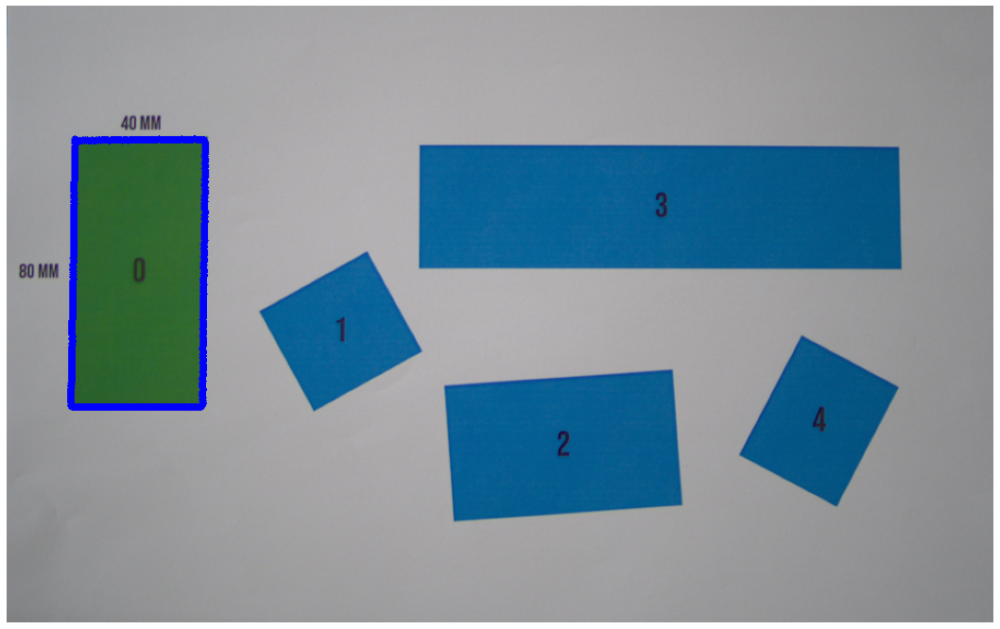

In [21]:
_, num_contours, contours  = find_contours(mask, external=False) ###
print(f'Found {num_contours} contours.')

# pick only the contour with the biggest area
contour_biggest = max(contours, key=cv2.contourArea)
print(f'Biggest contour area: {cv2.contourArea(contour_biggest)}, coordinates:\n {contour_biggest.reshape((-1, 2)).tolist()}')
contour_drawn = cv2.drawContours(img_patterns.copy(), [contour_biggest], -1, color=(255, 0, 0), thickness=5)
plot_images(contour_drawn)

Z výsledných souřadnic vidíme, že kontura netvoří přesný obdelník, proto ji musíme obdelníkem aproximovat. To lze pomocí funkce [cv2.minAreaRect](https://docs.opencv.org/3.1.0/d3/dc0/group__imgproc__shape.html#ga3d476a3417130ae5154aea421ca7ead9). Návratovou hodnotou této funkce je tuple - (střed obdélníku (x,y), (výška, šířka), úhel rotace obdélníku). Jedna otázka zní, co je výška a co je šířka? Musíte to vždycky kontrolovat okem.

Pomocná funkce [cv2.boxPoints()](https://docs.opencv.org/3.1.0/d3/dc0/group__imgproc__shape.html#gaf78d467e024b4d7936cf9397185d2f5c) převádí nalezený obdelník z formátu (střed obdélníku (x,y), (šířka, výška), úhel rotace obdélníku) na 4 rohové body obdélníku ve formátu (x, y). To se může hodit např. k vizualizaci (lze použít jako vstup pro cv2.drawContours()). Pozor, pořadí vrácených bodů není zaručeno.

Rect tuple: ((127.9771957397461, 259.5626220703125), (129.24134826660156, 262.4886779785156), 0.7206636071205139)

(cx, cy)=(127.9771957397461, 259.5626220703125)
(height, width)=(129.24134826660156, 262.4886779785156)
angle=0.7206636071205139

Rect points: [[61.71089172363281, 389.9837951660156], [65.01236724853516, 127.51588439941406], [194.24349975585938, 129.14144897460938], [190.9420166015625, 391.609375]]


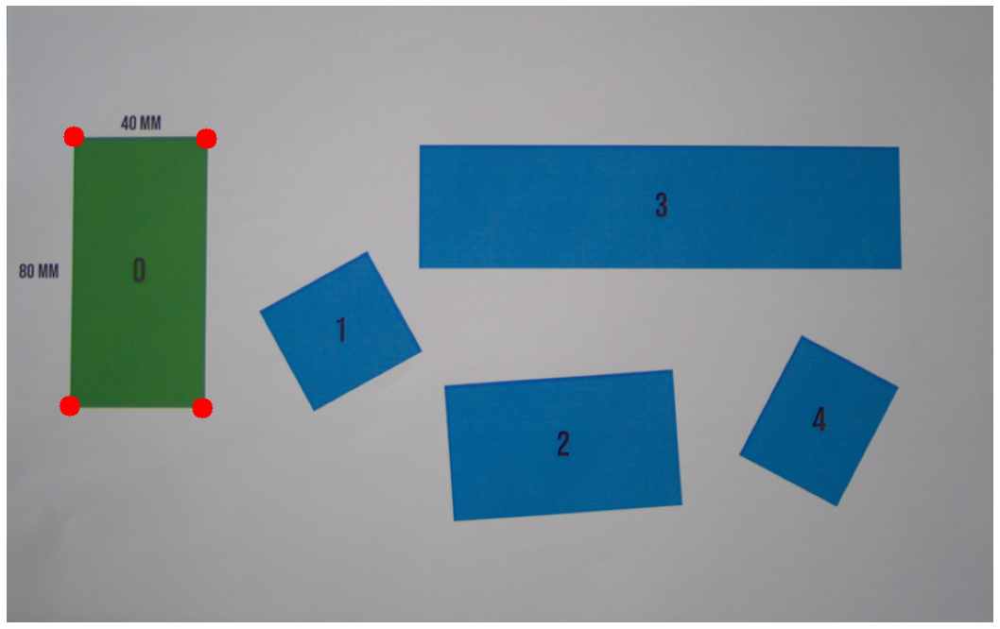

In [25]:
rect = cv2.minAreaRect(contour_biggest.reshape((-1, 2))) ###
print(f'Rect tuple: {rect}')
print()
print(f'(cx, cy)={rect[0]}')
print(f'(height, width)={rect[1]}')
print(f'angle={rect[2]}')
print()
print(f'Rect points: {cv2.boxPoints(rect).tolist()}')

box_points_drawn = img_patterns.copy()
for p in cv2.boxPoints(rect):
    cv2.circle(box_points_drawn,(int(p[0]),int(p[1])), 10, (0,0,255), -1)
plot_images(box_points_drawn)

**6) Nalezenou šířku referenčního obdelníku v pixelech můžeme konečně využít k získání poměru skutečné šířky obdélníku v reálných jednotkách a pixelové šířky obdélníku v obraze. Tento poměr budeme následně potřebovat k výpočtu rozměrů ostatních neznámých objektů.**

In [35]:
ref_width_image, ref_height_image = rect[1] ###
real_image_ratio = ref_height_real / ref_height_image ### 
print(f'Ratio between real width and image width: {real_image_ratio}')

Ratio between real width and image width: 0.30477505017015594


**7) Zkontrolujte si, že přepočtené hodnoty odpovídají reálné velikosti referenčního obdélníku.**

In [36]:
print(f'real size: {(ref_width_real, ref_height_real)}')
print(f'recalculated size: {(ref_width_image*real_image_ratio, ref_height_image*real_image_ratio)}')

real size: (40, 80)
recalculated size: (39.389538402012086, 80.0)


---

### Úkol 2

Úkol 1 máme za sebou a už víme poměr mezi rozměrem v cm a pixelech, tím pádem už můžeme naměřit rozměry ostatních objektů na obrázku s neznámými rozměry.

**1) Libovolným způsobem získejte masky objektů s neznámými skutečnými rozměry.**

In [42]:
@interact(h_range=create_slider(min=0, max=360, description='Hue:'),
          s_range=create_slider(min=0, max=255, description='Saturation:'),
          v_range=create_slider(min=0, max=255, description='Value:'))
def _(h_range, s_range, v_range):

    lower_bound = (to_intensity(h_range[0]), s_range[0], v_range[0])
    upper_bound = (to_intensity(h_range[1]), s_range[1], v_range[1])
    
    mask = segmentation_two_thresholds(img_patterns_color,lower_bound,upper_bound) ###
    plot_images(mask, apply_mask(img_patterns, mask))

interactive(children=(IntRangeSlider(value=(0, 360), continuous_update=False, description='Hue:\xa0\xa0\xa0\xa…

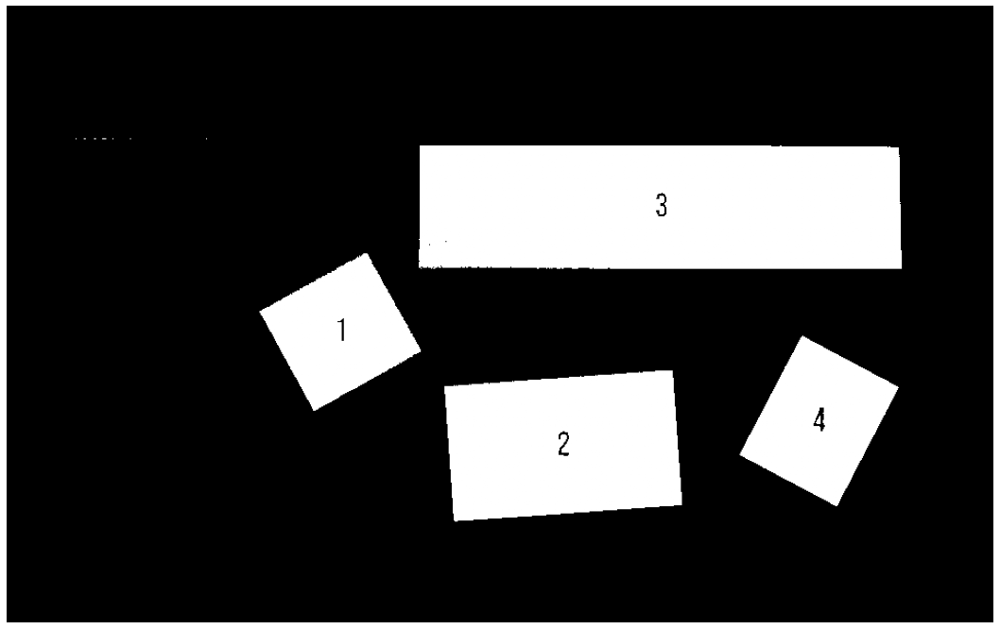

In [43]:
lower_bound = (to_intensity(180), 102, 0) ###
upper_bound = (to_intensity(240), 255, 161) ###

mask = segmentation_two_thresholds(img_patterns_color, lower_bound, upper_bound) ###
plot_images(mask)

**2) Nalezněte v nové masce snímku kontury stejně jako v případě referenčního objektu a následně proveďte filtrování kontur podle jejich obsahu. Prahovou hodnotu obsahu v pixelech (threshold) je nutno zvolit experimentálně.**

Found 13 contours.
After filtering, 4 contours remained.


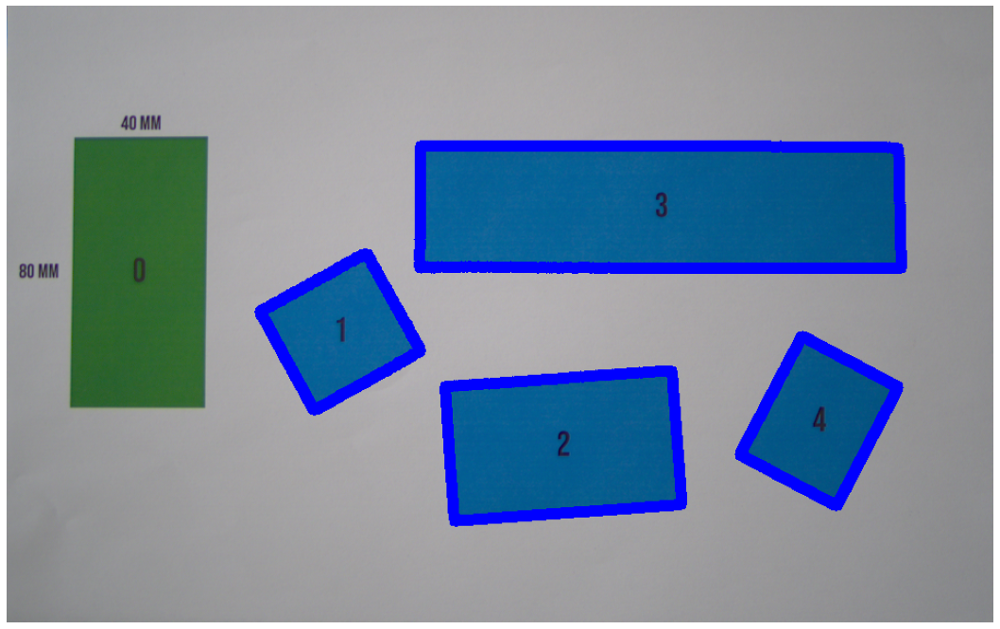

In [47]:
_, num_contours, contours = find_contours(mask, external=False)
print(f'Found {num_contours} contours.')

# Filter out noise
threshold = 200 ###
contours =  [c for c in contours if cv2.contourArea(c) > threshold]
print(f'After filtering, {len(contours)} contours remained.')

contour_drawn = cv2.drawContours(img_patterns.copy(), contours, -1, color=(255, 0, 0 ), thickness=10)
plot_images(contour_drawn)

# Sort contours by area. Just for better debugging.
contours.sort(key=cv2.contourArea, reverse=True)

**3) Nalezněte skutečné rozměry objektu**

Nyní potřebujeme pro jednotlivé kontury zjistit jejich skutečné rozměry, které chceme vizualizovat do výsledného obrázku.

Pro každou konturu tedy získáme jeji obdélníkovou aproximaci pomocí [cv2.minAreaRect](https://docs.opencv.org/3.1.0/d3/dc0/group__imgproc__shape.html#ga3d476a3417130ae5154aea421ca7ead9). Následně můžeme vypočítat skutečnou šířku a výšku objektu, díky předešlému vypočítanému poměru mezi skutečnou šířkou a pixelovou šířkou. Posledním krokem je volání funkce `draw_real_sizes()`, která se do vstupního obrázku pokusí vykreslit rozměry nalezeného objektu.

_Poznámka: pokud funkce `draw_real_sizes` vyhazuje chybu, změňte crop obrázku, jelikož funkce nemá dost místa, aby na okrajích vypsala text._

(119.0, 469.0) 14.293949852980314 3.626823097024856
(132.23452758789062, 222.86077880859375) 6.792240504234918 4.0301784779826235
(107.70477294921875, 131.1942901611328) 3.9984746365897252 3.28257275791634
(110.82372283935547, 120.24519348144531) 3.6647734876027607 3.3776305688408024


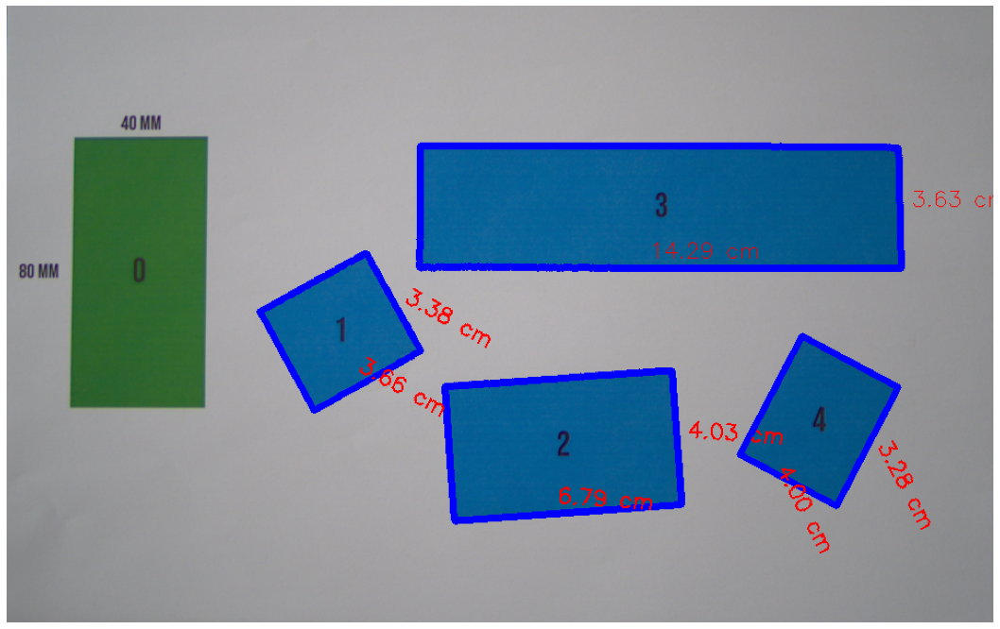

In [55]:
# create a copy of original image
sizes_drawn = img_patterns.copy()
contour_biggest = max(contours, key=cv2.contourArea)

for c in contours:
    rect = cv2.minAreaRect(c) ###
    shape_height, shape_width = rect[1] ### 
    real_width = shape_width*real_image_ratio / 10  ###
    real_height = shape_height*real_image_ratio / 10 ###
    print(rect[1], real_width, real_height)
    
    cv2.drawContours(sizes_drawn, [c], -1, color=(255, 0, 0 ), thickness=5)
    sizes_drawn = draw_real_sizes(
        sizes_drawn, ###
        rect, ###
        real_width, ###
        real_height, ###
        lbl_size_scale=.7,
        lbl_color=(0, 0, 255),
        lbl_thickness=1
    ) ###

plot_images(sizes_drawn)